In [528]:
import cv2
import numpy as np
import requests
from itertools import product
import matplotlib.pyplot as plt
import matplotlib
import scipy.optimize
import os

matplotlib.rcParams['figure.figsize'] = (12,8)

# HW6: Multiple View Geometry

In the lst couple of weeks we've talked about multiple-view geometry. The main pursuits in this domain are:
* Reconstructing the 3D geometry of the objects in the visible scene
  * Dense reconstruction with stereo
  * Sparse reconstruction with feature key-points (e.g corners)
* Estimating the pose (location, orientation) of the cameras looking at the scene


We will work with images from a well known Structure-from-Motion dataset: https://cvlab.epfl.ch/data/data-strechamvs/

Download images

In [529]:
DOWNLOAD_IDS = [
    '1G9NS27L2YEgMUzU34iquIm-A5MBlYiwr',
    '1gR65HLkcAcksolu3cU46MxPY4cn_V8Mw',
    '1CLgiVSltl69dYmZOQV9Zt7wfWFTAochn',
    '1WiuVyg4btUJQU_1XOhAOwpYWjlATuyaw',
    '1XYWtRQJ6REJEpEgza0tEoIXNNLTB2k88',
    '1661OnKt8Ns5KvWiy6FSI95G7NXVnKOCh',
    '177YlElwbg8vlPiLzk5P-JKD4Ce3a7vs7',
    '1Ucr5vDIzUwdaxde5f_gdk2FYH3jl8suV',
    '1M6j1fdKcgULUFqhy6kCVwOQUOFtzref7',
    '1CQpPpefDgxv5DDGYprmvlNK_cq-hNqDi',
    '1Bx3AJo9q_ttZ-qv3ZZT1B_9lJeO5kguz',
    ]
images = []
for dl_id in DOWNLOAD_IDS:
    filename = f"image{dl_id}.jpg"
    if not os.path.exists(filename):
        with open(filename, "wb") as f:
            f.write(requests.get("https://drive.google.com/uc?id=%s"%(dl_id)).content)
    images.append(cv2.resize(cv2.imread(filename, cv2.IMREAD_COLOR)[...,::-1], (0,0), fx=0.25, fy=0.25))

### Image Feature Graph
To get started with an MVG pipeline we need to extract features and descriptors from images.

Below is a class that I wrote to help with some of this work so you can focus on the algorithms.

In [530]:
# The MatchMaker class is a helper class to store the keypoints matches and match graph
# and provide some helper functions to get robust, aligned matches between two images.
# I'm providing this class to you to speed up our process, but you should read through
# it to understand how it works roughly.
class MatchMaker:
    def __init__(self) -> None:
        self.detector = cv2.SIFT_create()
        self.matcher = cv2.FlannBasedMatcher(
            dict(algorithm=1, trees=5), dict(checks=50))
        self.images = []
        self.kpts = []
        self.descs = []
        self.matches = {}
        self.kpts_match_graph = None
        self.point3d_camera_visibility = None
        self.map_3d = None
        self.poses = None
        pass

    def getMatchesFilterFundamental(self, left_image_index, right_image_index):
        matches_raw = list(self.matcher.knnMatch(
            self.descs[left_image_index], self.descs[right_image_index], 2))
        matches_ = []
        for (m, n) in matches_raw:
            if m.distance < 0.7*n.distance:
                matches_.append(m)

        # filter by finding the fundamental matrix with RANSAC
        mptsif, mptsjf = zip(*[(self.kpts[left_image_index][m.queryIdx].pt,
                                self.kpts[right_image_index][m.trainIdx].pt)
                               for m in matches_])
        mptsif, mptsjf = np.array(mptsif), np.array(mptsjf)
        _, mask = cv2.findFundamentalMat(mptsif, mptsjf, cv2.FM_RANSAC)
        matches_ = [matches_[i] for i in range(len(matches_)) if mask[i]]

        return np.array(matches_)

    def addImagesAndExtractKeypoints(self, images):
        self.images = images
        self.kpts, self.descs = zip(
            *[self.detector.detectAndCompute(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), None) for img in images])
        # store the 3D points visibility graph in a 2D array
        self.point3d_camera_visibility = -np.ones((len(self.images), 500), np.int32)
        # camera poses
        self.poses = np.zeros((len(self.images), 3, 4))

    def buildMatchGraph(self):
        # Match every image with every other image (without repetition).
        # For each pair of images, get the matches and fundamental matrix using the helper function.
        # store in a dictionary with key (i,j) and value (mptsif,mptsjf,inliers,f_ij)
        self.matches = {}
        # store the match graph in a 2D array
        self.kpts_match_graph = -np.ones((len(self.images), len(self.images), np.max(
            [len(kptsi) for kptsi in self.kpts])), dtype=np.int32)
        
        for i, j in product(range(len(images)), repeat=2):
            if i < j:
                self.matches[(i, j)] = self.getMatchesFilterFundamental(i, j)

                # update the match graph kpts_match_graph
                for m in self.matches[(i, j)]:
                    self.kpts_match_graph[i, j, m.queryIdx] = m.trainIdx # right view index
                    self.kpts_match_graph[j, i, m.trainIdx] = m.queryIdx # left view index

    def getMatchGraph(self):
        if self.kpts_match_graph is None:
            raise Exception("The match graph is not computed yet.")
        return self.kpts_match_graph

    def aligned2D(self, left_image_index, right_image_index):
        ptsl2d, ptsr2d = zip(*[(self.kpts[left_image_index][m.queryIdx].pt,
                                self.kpts[right_image_index][m.trainIdx].pt)
                               for m in self.matches[(left_image_index, right_image_index)]])
        return np.array(ptsl2d), np.array(ptsr2d)
    
    def aligned2DNotInMap(self, left_image_index, right_image_index):
        ptsl2d, ptsr2d, backidxL, backidxR = zip(*[(self.kpts[left_image_index][m.queryIdx].pt,
                                                    self.kpts[right_image_index][m.trainIdx].pt,
                                                    m.queryIdx, 
                                                    m.trainIdx)
                               for m in self.matches[(left_image_index, right_image_index)]
                                 if not m.queryIdx in self.point3d_camera_visibility[left_image_index] and 
                                    not m.trainIdx in self.point3d_camera_visibility[right_image_index]
                               ])
        return np.array(ptsl2d), np.array(ptsr2d), np.array(backidxL), np.array(backidxR)
    
    def alignedIndices(self, left_image_index, right_image_index):
        indl2d, indr2d = zip(*[(m.queryIdx, m.trainIdx)
                               for m in self.matches[(left_image_index, right_image_index)]])
        return np.array(indl2d), np.array(indr2d)

    def addNewPoints3D(self, pts3d, li, rj, mask=None):
        if self.map_3d is None:
            self.map_3d = np.zeros((0, 3))
        if mask is None:
            mask = np.ones(pts3d.shape[0], dtype=np.bool)

        mapIS = self.map_3d.shape[0]
        mapIE = mapIS + pts3d[mask].shape[0]
        alignedIdxL, alignedIdxR = self.alignedIndices(li, rj)
        self.point3d_camera_visibility[li, mapIS:mapIE] = alignedIdxL[mask]
        self.point3d_camera_visibility[rj, mapIS:mapIE] = alignedIdxR[mask]
        self.map_3d = np.concatenate([self.map_3d, pts3d[mask]])

    def R(self, i):
        return self.poses[i, :3, :3]
    
    def t(self, i):
        return self.poses[i, :3, 3]
    
    # get 2D keypoints for a given image (rj, "right") which match 3D points in 
    # the map from another image (li, "left")
    def alignedKptsTo3DMap(self, li_3d, rj_2d):
        # left view indices from 3D points on the current map
        li_3d_idx = self.point3d_camera_visibility[li_3d]
        # right view indices that align to the left view indices above
        indices_rj = self.kpts_match_graph[li_3d, rj_2d, li_3d_idx]
        # get the keypoints from the right view
        selected_rj_kpts = np.array(self.kpts[rj_2d])[indices_rj[indices_rj > -1]]
        # get the keypoints from the left view
        selected_li_kpts = np.array(self.kpts[li_3d])[li_3d_idx[li_3d_idx > -1]]
        return selected_li_kpts, selected_rj_kpts

    # get 2D points for a given image (rj, "right") with corresponding 3D 
    # points in the map from any other image (li, "left")
    def aligned2D3D(self, rj_2d):
        mpts2Drj = []
        mpts3D = []
        backmapping = []

        # for each 3D point in the map
        for p3d_id in range(self.map_3d.shape[0]):
            # check its visibility in all the left views
            for li_3d in range(self.point3d_camera_visibility.shape[0]):
                if li_3d != rj_2d: # skip the right view...
                    # the index of the 3D point in the left view
                    li_3d_kpt_idx = self.point3d_camera_visibility[li_3d, p3d_id]
                    if li_3d_kpt_idx < 0: 
                        continue # this 3D point is not visible in the left view
                    rj_2d_kpt_idx = self.kpts_match_graph[li_3d, rj_2d, li_3d_kpt_idx]
                    if rj_2d_kpt_idx > -1: # this 3D point is visible in both views
                        pt = self.kpts[rj_2d][rj_2d_kpt_idx].pt
                        mpts2Drj.append((pt[0], pt[1], 1.0))
                        mpts3D.append(self.map_3d[p3d_id])
                        backmapping.append((p3d_id, rj_2d_kpt_idx))
                        break
                        
        # return an interleaved array of 2D and 3D points
        return np.stack([mpts2Drj, mpts3D], axis=1), backmapping
    
    def alignedMapTo2DAndVisibility(self):
        # return an aligned list of 2D image points and a list of 3D points from the map
        mpts2DForViews = np.zeros((self.point3d_camera_visibility.shape[0], self.map_3d.shape[0], 2), dtype=np.float32)
        visibility = np.zeros((self.point3d_camera_visibility.shape[0], self.map_3d.shape[0]), dtype=np.uint8)

        # for each 3D point in the map
        for p3d_id in range(self.map_3d.shape[0]):
            # check its visibility in all the left views
            for view_i in range(self.point3d_camera_visibility.shape[0]):
                # the index of the 3D point in the view
                li_3d_kpt_idx = self.point3d_camera_visibility[view_i, p3d_id]
                if li_3d_kpt_idx < 0: 
                    # this 3D point is not visible in the view
                    mpts2DForViews[view_i, p3d_id] = [0, 0]
                    visibility[view_i, p3d_id] = 0
                else:
                    # this 3D point is visible in the view
                    pt = self.kpts[view_i][li_3d_kpt_idx].pt
                    mpts2DForViews[view_i, p3d_id] = [pt[0], pt[1]]
                    visibility[view_i, p3d_id] = 1

        return self.map_3d, mpts2DForViews, visibility

In [531]:
# initialize the MatchMaker class and extract keypoints from the images
mm = MatchMaker()
mm.addImagesAndExtractKeypoints(images)
mm.buildMatchGraph()

Initialize the camera intrinsic matrix. This is given to us, and guranteed to be similar and cosistent across images of the dataset.

In [532]:
# K is the camera matrix, given to us by the dataset provider
K_original = np.array([[2759.48, 0, 1520.69],[0, 2764.16, 1006.81],[0, 0, 1]])
# W and H are the width and height of the images
W,H = mm.images[0].shape[1], mm.images[0].shape[0]
# K_s is the scaled camera matrix, we use it because we scaled the images to 0.25 their original size
K, _ = cv2.getOptimalNewCameraMatrix(K_original, np.zeros(5), (W*4,H*4), 0, (W,H))
# Kinv is the inverse of K
Kinv = np.linalg.inv(K)

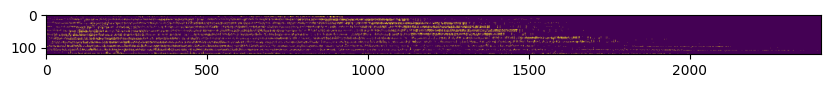

In [533]:
# show the match graph for all images
plt.figure(figsize=(10, 10))
plt.imshow(np.vstack(mm.getMatchGraph()[:]) > -1)
plt.show()

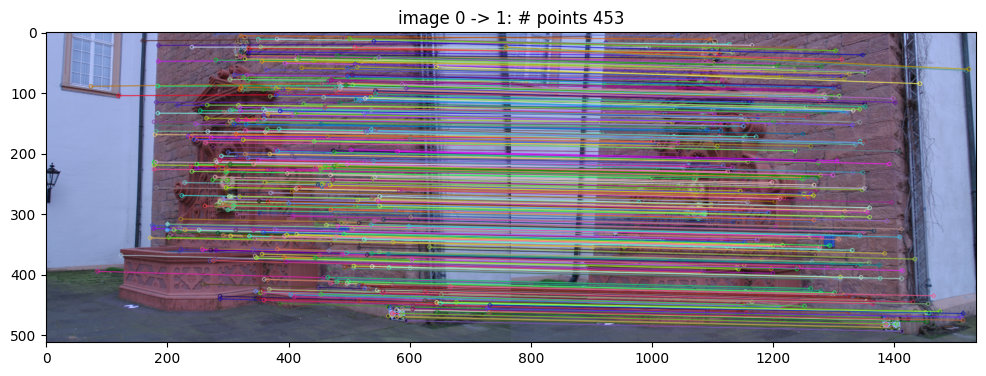

In [534]:
# draw the matches between image 0 and image 1
plt.imshow(cv2.drawMatches(mm.images[0],mm.kpts[0],mm.images[1],mm.kpts[1],mm.matches[(0,1)],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS))
plt.title('image 0 -> 1: # points %d'%(len(mm.matches[(0,1)])));

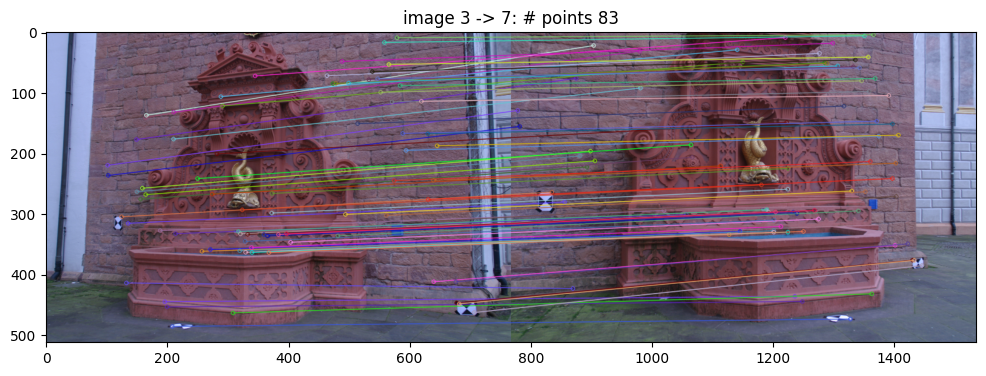

In [535]:
# draw the matches between image 3 and image 7
plt.imshow(cv2.drawMatches(mm.images[3],mm.kpts[3],mm.images[7],mm.kpts[7],mm.matches[(3,7)],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS))
plt.title('image 3 -> 7: # points %d'%(len(mm.matches[(3,7)])));

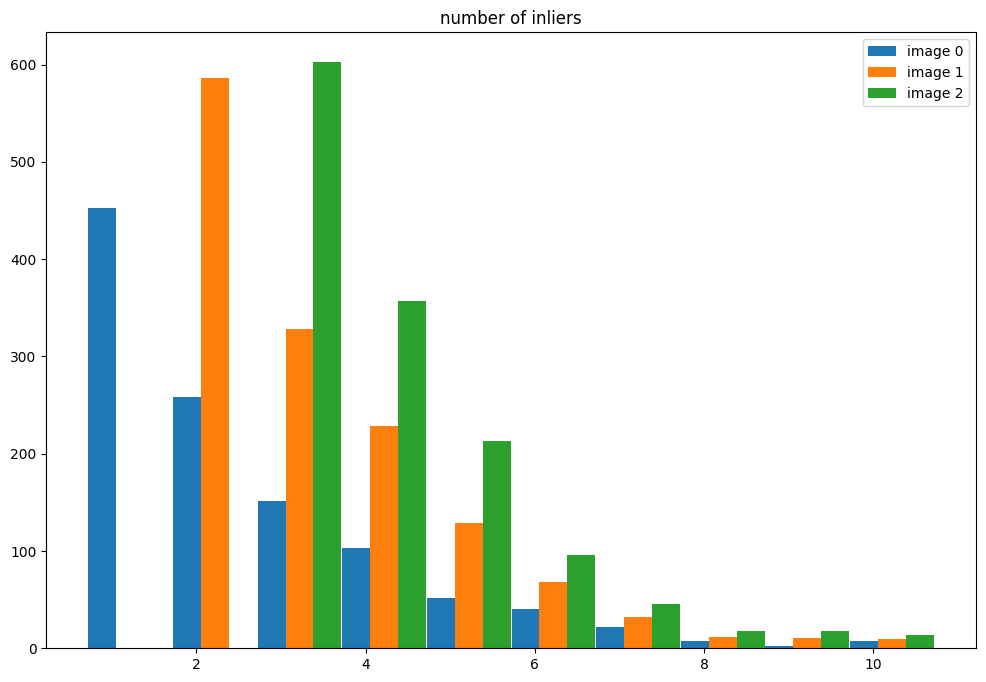

In [536]:
# plot the number of inliers between images 0, 1 and 2 and the rest of the images
# in a multi-bar plot
N = len(mm.images)
plt.bar(np.arange(1,N)-0.11,[len(mm.matches[(0,i)]) for i in range(1,N)], label='image 0', width=0.33)
plt.bar(np.arange(1,N)+0.22,[0]+[len(mm.matches[(1,i)]) for i in range(2,N)], label='image 1', width=0.33)
plt.bar(np.arange(1,N)+0.55,[0,0]+[len(mm.matches[(2,i)]) for i in range(3,N)], label='image 2', width=0.33)
plt.legend()
plt.title('number of inliers');


Notice the sharp drop in inlier matches as the views change the perspective. Only consecutive images have a high inlier count.

However - we do want to work with a wide baseline. That's because very small shifts between viewpoints can approximate a Homography ("flat" planar) transformation, which is NOT what we want.

Here comes your part!

## 1. Two-frame Structure-from-Motion

1. Estimate essential matrix (with re-scaling)
1. Decompose to find $[R|t]$
1. Triangulate sparse 3D point cloud

### Estimate the essential matrix - the linear method

The epipolar constraint: $x_\mathrm{R}^\top E x_\mathrm{L} = 0$ leads to the following $Ab=0$ system of equations: (Szeliski's eqn 11.33)
$$
\begin{pmatrix}x_R & y_R & 1 \end{pmatrix}
\begin{bmatrix}e_{00} & e_{01} & e_{02} \\ e_{10} & e_{11} & e_{12} \\ e_{20} & e_{21} & e_{22}\end{bmatrix}\begin{pmatrix}x_L\\y_L\\1 \end{pmatrix} = 0
\\
\begin{pmatrix}
x_Re_{00} + y_Re_{10} + e_{20} &
x_Re_{01} + y_Re_{11} + e_{21} &
x_Re_{02} + y_Re_{12} + e_{22} 
\end{pmatrix}
\begin{pmatrix}x_L\\y_L\\1 \end{pmatrix} = 0
\\
x_Lx_Re_{00} + x_Ly_Re_{10} + x_Le_{20} + 
y_Lx_Re_{01} + y_Ly_Re_{11} + y_Le_{21} +
x_Re_{02} + y_Re_{12} + e_{22} 
= 0
\\
\begin{pmatrix}
\cdots \\
x_Lx_R & y_Lx_R & x_R &
x_Ly_R & y_Ly_R & y_R &
x_L & y_L & 1 \\
\cdots \\
\end{pmatrix}
\begin{pmatrix}
e_{00} \\ e_{01} \\ e_{02} \\ e_{10} \\ e_{11} \\ e_{12} \\ e_{20} \\ e_{21} \\ e_{22} \\
\end{pmatrix}=0
$$
(where every row of A is essentially $x_\mathrm{R}^\top x_\mathrm{L}$ ($3\times3$) flattened, e.g. `(xR.T @ xL).ravel()`)
$$
\begin{pmatrix}x_R \\ y_R \\ 1 \end{pmatrix}\begin{pmatrix}x_L & y_L & 1 \end{pmatrix}=
\begin{bmatrix}x_Lx_R & y_Lx_R & x_R \\ x_Ly_R & y_Ly_R & y_R  \\ x_L & y_L & 1  \end{bmatrix}
$$

However, remember we talked about the scaling problem, where $x*x$ is orders of magnitude larger than $x$ and $1$, therefore we should normalize the points to the $[-1,1]$ range before solving. Afterwards we can apply the inverse scaling to $E$ to negate this effect.

Populate the matrix $A$ and solve for $E$ in the least squares sense: $\hat{b} = \mathop{\arg\min}_b|Ab|^2$, which means taking the SVD (`np.linalg.svd`) and using the last row of $V^\top$, where the singular value is 0.

In [537]:
# get an aligned list of 2D image points from view 3 and 7
mpts01o,mpts10o = mm.aligned2D(3, 7) # `o` is for "original"

# Transform the points to normalized coordinates - meaning multiply on the left by the inverse of the camera matrix
# use cv2.convertPointsToHomogeneous to convert the points to homogeneous coordinates
# due to some weirdness in the way cv2 works, we need to use np.squeeze to remove the extra dimension
# as well as .T (transpose) to get the correct shape (N,3) instead of (N,1,3)
# the whole thing looks like this: np.matmul(Kinv, cv2.convertPointsToHomogeneous(pts).squeeze().T).T
mpts01f,mpts10f = np.matmul(Kinv, cv2.convertPointsToHomogeneous(mpts01o).squeeze().T).T, np.matmul(Kinv, cv2.convertPointsToHomogeneous(mpts10o).squeeze().T).T

In [538]:
# Calculate the Essential Matrix according to the above equations
# Populate A matrix and solve Ab=0 in LLSQ sense. Take E as last row of VT (last column of V)
def calculateEssentialMatrix(ptsLeftHomog, ptsRightHomog):
    A = np.array([np.outer(xR, xL).ravel() for xL, xR in zip(ptsLeftHomog, ptsRightHomog)])
    _, _, VT = np.linalg.svd(A)
    E = VT[-1].reshape(3, 3)
    return E


We will implement a "poor man's RANSAC", randomly selecting 9 point-pairs and calculating $E$ from them, then counting the supporting "inlier" points by checking how far they are from their corresponding epilines.

We will be using our homebrew RANSAC again further down.

In [539]:
# RANSAC is one of the most popular methods for finding the best model fit for a given set of data
# In this case, we want to find the best Essential Matrix for the given set of 2D image points
# We will use the following steps:
# 1. Randomly select 9 points from the set of 2D image points
# 2. Calculate the Essential Matrix for these 9 points with the above function (calculateEssentialMatrix)
# 3. Find the inliers for this Essential Matrix
# 4. Repeat steps 1-3 15000 times and keep the best model (the one with the most inliers)
# 5. Recalculate the Essential Matrix for the inliers of the best model

maxv = 0
bestMask = None
E = None
for i in range(15000):
    idx = np.random.choice(len(mpts01f), 9, replace=False)
    E_guess = calculateEssentialMatrix(mpts01f[idx], mpts10f[idx])

    l0 = E_guess @ mpts01f.T
    d = np.abs(np.array([np.matmul(mpts10f[j], l) for j, l in enumerate(l0.T)]))
    mask = d < 0.0002
    v = np.count_nonzero(mask)

    if v > maxv:
        maxv = v
        bestMask = mask
        E = calculateEssentialMatrix(mpts01f[bestMask], mpts10f[bestMask])

        # Monitor progress while searching for a better model
        err = np.mean(d[bestMask]) if np.any(bestMask) else np.inf
        print(f"{maxv} / {len(mask)}. error = {err}")


17 / 83. error = 2.567309168338301e-05
52 / 83. error = 7.499471453567929e-05
54 / 83. error = 9.495691987494978e-05
55 / 83. error = 8.106206494884408e-05
56 / 83. error = 8.787444725123616e-05
57 / 83. error = 8.260616258248223e-05
60 / 83. error = 7.656361629630643e-05
61 / 83. error = 8.385587222769152e-05


In [540]:
E

array([[-0.00883472,  0.18145886, -0.02484646],
       [ 0.32951611,  0.04613232,  0.62518153],
       [ 0.00364769, -0.68052289,  0.04112873]])

In [541]:
# Use cv2.findEssentialMat to verify your result
E_cv, mask = cv2.findEssentialMat(mpts01f[:,:2],mpts10f[:,:2],np.eye(3,3),method=cv2.RANSAC,prob=0.999,threshold=0.0002)
E_cv, cv2.countNonZero(mask)

(array([[ 0.0075929 , -0.18431115,  0.02401626],
        [-0.32841584, -0.04294457, -0.62458119],
        [-0.00306569,  0.68110037, -0.04104875]]),
 50)

In [542]:
# if your result is widely different from the cv2 result, check your work.

### Epipolar Lines

Let's inspect the epipolar lines arising from the essential matrix you've found. Verifying the epilines make sense is a great way to overall make sure your solution is good and matches your expectation (i.e the motion between cameras).

In [543]:
# find the fundamental matrix from the essential matrix by using the camera matrix: F = Kinv.T * E * Kinv
# you can optionally normalize the fundamental matrix by dividing it by its F[2,2] element
# save it in the variable `F_fromE`

F_fromE = Kinv.T @ E @ Kinv
if np.abs(F_fromE[2,2]) > 1e-12:
    F_fromE = F_fromE / F_fromE[2,2]


Calculate the epipolar lines, which is simply $l_\mathrm{Left} = F \tilde{x}_\mathrm{Right}$, where $\tilde{x}$ is the homogeneous augmented 2D point $x$. Each point in the right image is a line on the left image, w.l.o.g

In [544]:
def computeEpipolarLines(F, pts_list):
    pts_h = cv2.convertPointsToHomogeneous(pts_list).squeeze()
    lines = (F @ pts_h.T).T
    return lines

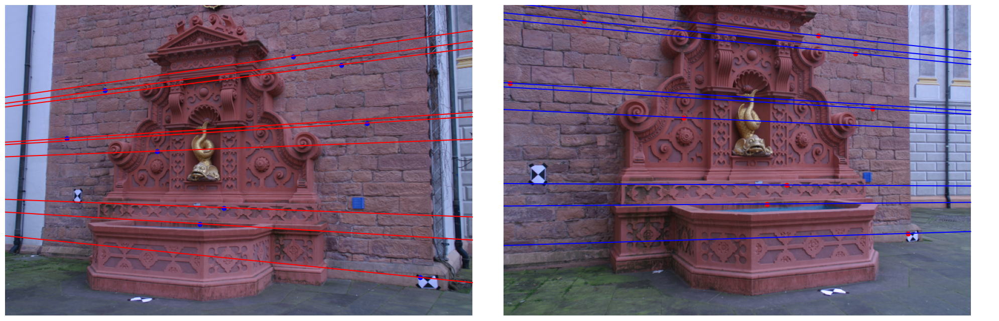

In [545]:
# for your convenience, we've provided the code to draw the epipolar lines.
# you can use it to verify your work and that the epipolar lines match what we got.
lines_right_image = computeEpipolarLines(F_fromE, mpts01o) # left points -> lines in right image
lines_left_image = computeEpipolarLines(F_fromE.T, mpts10o) # right points -> lines in left image

# draw epipolar lines
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(images[3])
step = 10
for i in range(0, len(lines_left_image), step):
    a,b,c = lines_left_image[i]
    x0,y0 = 0, int(-c/b)
    x1,y1 = W, int((-a*W-c)/b)
    plt.plot([x0,x1],[y0,y1],color='r')
    plt.scatter([mpts01o[i,0]],[mpts01o[i,1]],c='b')
plt.axis('off')
plt.ylim(H, 0)

plt.subplot(1,2,2)
plt.imshow(images[7])
for i in range(0, len(lines_right_image), step):
    a,b,c = lines_right_image[i]
    x0,y0 = map(int, [0, -c/b])
    x1,y1 = map(int, [W, -(a*W+c)/b])
    plt.plot([x0,x1],[y0,y1],color='b')
    plt.scatter([mpts10o[i,0]],[mpts10o[i,1]],c='r')
# remove the axes
plt.axis('off')
# crop to just the image (no whitespace)
plt.ylim(H, 0)

plt.tight_layout()

Verify that your epilines make sense, e.g. that they convrge in a point in the right side of the image but outside of the image - that's where the other camera would be. The "right" image will have the other camera on the left, and vice versa.

### Decompose $E$ to $[R|t]$
Recall the essential matrix is composed: $E = [t]_\times R$.

The decomposition can be performed using SVD, e.g. $E = U\Sigma V^\top$, and set $t$ to be the last column of $\pm U$, while
$$
\begin{align}
W &= \begin{bmatrix}0 & -1 & 0 \\ 1 & 0 & 0 \\ 0 & 0 & 1\end{bmatrix}  \mathrm {,\,\,A\,\, 90^\circ\,\, rotation}\\
R'_1 &= UWV^\top\\
R'_2 &= UW^{-1}V^\top\\
R'_3 &= -UWV^\top\\
R'_4 &= -UW^{-1}V^\top\\
\end{align}
$$
But we keep only the 2 rotation matrices e.g. $R_1, R_2$ that have positive determinant.

This results in 4 configurations: $(t,R_1)$,$(t,R_2)$,$(-t,R_1)$,$(-t,R_2)$. See your readings for the reason.

To find the correct pair we should use the "cheirality check", which essentially means we triangulate 3D points and check they have positive Z coordinates and they are indeed in front of both cameras.

In [546]:
# Take SVD of E
# t is the last column of U
# there are four possible rotations: R1 = UWV^T, R2 = UW^TV^T, R3 = -UWV^T, R4 = -UW^TV^T
# but keep only the 2 rotations with positive determinant (use np.linalg.det)
# keep the good rotations in a variable called Rs

U, _, VT = np.linalg.svd(E)
t = U[:, -1].reshape(3, 1)

W = np.array([[0, -1, 0],
              [1,  0, 0],
              [0,  0, 1]])

R_candidates = [U @ W @ VT, U @ W.T @ VT, -U @ W @ VT, -U @ W.T @ VT]
Rs = [R for R in R_candidates if np.linalg.det(R) > 0]


In [547]:
# print out your results
Rs,t

([array([[ 0.97502469,  0.01498068, -0.22159069],
         [ 0.02824499, -0.99798527,  0.05681224],
         [-0.22029315, -0.06165216, -0.9734834 ]]),
  array([[ 0.73437064, -0.05971259, -0.67611698],
         [ 0.01018098,  0.99697972, -0.07699205],
         [ 0.67867232,  0.04965717,  0.73276057]])],
 array([[0.96564905],
        [0.02170709],
        [0.25894151]]))

In [548]:
# and you can cross-check your result with cv2.decomposeEssentialMat
cv2.decomposeEssentialMat(E)

(array([[ 0.73437064, -0.05971259, -0.67611698],
        [ 0.01018098,  0.99697972, -0.07699205],
        [ 0.67867232,  0.04965717,  0.73276057]]),
 array([[ 0.97502469,  0.01498068, -0.22159069],
        [ 0.02824499, -0.99798527,  0.05681224],
        [-0.22029315, -0.06165216, -0.9734834 ]]),
 array([[0.96564905],
        [0.02170709],
        [0.25894151]]))

In [549]:
# again if you got a vastly different result, check your work
# but small changes in the domain of floating point errors are fine (e.g. 1e-3 range)

### Triangulate 3D points
Recall our work on triangulation once we have found the $R,t$ parameters:
$$
\displaystyle
\begin{align}
\begin{bmatrix}\lambda x^{(l)}\\\lambda y^{(l)}\\\lambda\end{bmatrix}
&=
\begin{bmatrix}
f_x & 0 & c_x \\
0 & f_y & c_y \\
0 & 0 & 1 \\
\end{bmatrix}
\begin{bmatrix}
r_1 & r_2 & r_3 & t_x\\
r_4 & r_5 & r_6 & t_y\\
r_7 & r_8 & r_9 & t_z
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}
=
\begin{bmatrix}
p_{11} & p_{12} & p_{13} & p_{14} \\
p_{21} & p_{22} & p_{23} & p_{24} \\
p_{31} & p_{32} & p_{33} & p_{34} \\
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}
\\
\begin{bmatrix}\lambda x^{(r)}\\\lambda y^{(r)}\\\lambda\end{bmatrix}
&=
\begin{bmatrix}
f_x & 0 & c_x & 0\\
0 & f_y & c_y & 0\\
0 & 0 & 1 & 0\\
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}\\
\end{align}
$$
Expand
$$
\begin{align}
x^{(l)}p_{31}X + x^{(l)}p_{32}Y + x^{(l)}p_{33}Z + x^{(l)}p_{34} &= p_{11}X + p_{12}Y + p_{13}Z + p_{14}\\
y^{(l)}p_{31}X + y^{(l)}p_{32}Y + y^{(l)}p_{33}Z + y^{(l)}p_{34} &= p_{21}X + p_{22}Y + p_{23}Z + p_{24}\\
x^{(r)}Z &= f_x X + c_x Z \\
y^{(r)}Z &= f_y Y + c_y Z
\end{align}
$$
Rearrange
$$
\begin{align}
(x^{(l)}p_{31} - p_{11})X + (x^{(l)}p_{32} - p_{12})Y + (x^{(l)}p_{33} - p_{13})Z + x^{(l)}p_{34} - p_{14} &= 0\\
(y^{(l)}p_{31} - p_{21})X + (y^{(l)}p_{32} - p_{22})Y + (y^{(l)}p_{33} - p_{23})Z + y^{(l)}p_{34} - p_{24} &= 0\\
-f_x X + 0Y + (x^{(r)} - c_x)Z &= 0 \\
0X + -f_y Y + (y^{(r)} - c_y)Z &= 0 \\
\end{align}
$$
Matrix form
$$
\begin{bmatrix}
x^{(l)}p_{31} - p_{11} & x^{(l)}p_{32} - p_{12} & x^{(l)}p_{33} - p_{13} & x^{(l)}p_{34} - p_{14} \\
y^{(l)}p_{31} - p_{21} & y^{(l)}p_{32} - p_{22} & y^{(l)}p_{33} - p_{23} & y^{(l)}p_{34} - p_{24} \\
-f_x & 0 & x^{(r)} - c_x \\
0 & -f_y & y^{(r)} - c_y
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}=0
$$

Now if we have 2 contributions to this system we can solve this linear system of equations $Ax=0$ in the constrained least squares sense (`np.linalg.svd`, take last row ot $V^\top$).

Write the triangulation routine

In [550]:
# write a function that triangulates points given a "right" camera extrinsics (R,t)
# assume that the "left" camera intrinsics are the identity matrix
# first compute the projection matrix P = K[R|t] (use e.g. np.matmul)
# for every point:
#   populate the A matrix according to the above equations
#   use np.linalg.svd to compute the SVD of A
#   the 3D point is the last column of V (last row of V^T)
#   normalize the homogeneous 3D point by dividing by its last element (homogeneous coordinate divide)
# return the 3D points in a numpy array of shape (N,3)
def triangulatePoints(pts2Dr, pts2Dl, R, t, K_):
    t = np.asarray(t).reshape(3, 1)

    # Compute right‑camera projection matrix: left camera = [I | 0], right camera = K[R | t]
    Rt = np.hstack((R, t))
    P = K_ @ Rt   # projection matrix for the right camera (and also left camera in this convention?)
    
    pts3d = []
    for pr, pl in zip(pts2Dr, pts2Dl):
        xr, yr = pr[0], pr[1]
        xl, yl = pl[0], pl[1]

        A = np.zeros((4, 4))

        # left‑camera rows: built from the *same* P (not from a separate P_left)
        A[0, :] = xl * P[2, :] - P[0, :]
        A[1, :] = yl * P[2, :] - P[1, :]

        # right‑camera rows: match the second snippet exactly
        A[2, :] = [-K_[0,0], 0, xr - K_[0,2], 0]
        A[3, :] = [0, -K_[1,1], yr - K_[1,2], 0]

        _, _, VT = np.linalg.svd(A)
        Xh = VT[-1]
        Xh = Xh / Xh[-1]
        pts3d.append(Xh[:3])

    return np.array(pts3d)





Make a decision about the 4 possible configurations (e.g. $(t,R_1)$,$(t,R_2)$,$(-t,R_1)$,$(-t,R_2)$) using the following criteria:
1. Cheirality check: Count how many points are in front of the camera (positive +z coordinate)
1. Reprojection check: Distance between original 2D point and 3D point reprojected back to 2D

In [551]:
# since we have two possible rotations and two possible translations (4 possible solutions)
# we need to pick the best one. We can do this by checking the cheirality of the points
# and the reprojection error. The best solution is the one with the most points in front
# of the camera (Z > 0) and the smallest reprojection error.
# write a loop that tries all 4 possible solutions and pick the best one.
# the solutions are: (Rs[0],t), (Rs[0],-t), (Rs[1],t), (Rs[1],-t)
# for each solution:
#   triangulate the points with triangulatePoints you wrote above
#   reproject the points back to the image domain using cv2.projectPoints
#   compute the cheirality (number of points with Z > 0) and the reprojection error
#   compute a score as the ratio of cheirality to reprojection error
#   print out the cheirality, reprojection error and score for each solution
#   keep the best score and the corresponding rotation and translation
# when using cv2.projectPoints, if you're projecting on the left image, use R = np.eye(3), t = np.zeros((3,1))
# if you're projecting on the right image, use R = Rs[i], t = t
# to calculate the reprojection error, use np.linalg.norm to compute the norm of the difference between the
# reprojected points (from cv2.projectPoints) and the original points (e.g. mpts01o for the left image)
maxv = 0
R_best = t_best = None

for rot, tra in [(Rs[0], t), (Rs[0], -t), (Rs[1], t), (Rs[1], -t)]:
    # Use (left, right) order, not (right, left)
    pts3d = triangulatePoints(mpts01o, mpts10o, rot, tra, K)

    # cheirality just check Z in reconstructed frame
    cheirality = np.count_nonzero(pts3d[:, 2] > 0)

    # project onto left image (R = I, t = 0)
    rvec_l, _ = cv2.Rodrigues(np.eye(3))
    tvec_l = np.zeros((3, 1))
    # project onto right image (R = rot, t = tra)
    rvec_r, _ = cv2.Rodrigues(rot)
    tvec_r = tra

    proj_l, _ = cv2.projectPoints(pts3d.astype(np.float64), rvec_l, tvec_l, K, None)
    proj_r, _ = cv2.projectPoints(pts3d.astype(np.float64), rvec_r, tvec_r, K, None)
    proj_l = proj_l.reshape(-1, 2)
    proj_r = proj_r.reshape(-1, 2)

    err_l = np.linalg.norm(proj_l - mpts01o, axis=1)
    err_r = np.linalg.norm(proj_r - mpts10o, axis=1)
    reproj_err = np.mean((err_l + err_r) * 0.5)   # or use one global norm if you prefer

    score = cheirality / (reproj_err + 1e-12)
    print(f"Cheirality: {cheirality}/{len(pts3d)}, Reprojection err: {reproj_err:.2f}, Score: {score:.2f}")

    if score > maxv:
        maxv = score
        R_best = rot
        t_best = tra   #do not flip


Cheirality: 49/83, Reprojection err: 0.59, Score: 82.54
Cheirality: 34/83, Reprojection err: 0.59, Score: 57.27
Cheirality: 83/83, Reprojection err: 0.59, Score: 139.81
Cheirality: 0/83, Reprojection err: 0.59, Score: 0.00


The reprojection error above should be < 10. If that's not the case it's likely the $E$ matrix isn't right - try finding it again.

In [552]:
R_best, t_best

(array([[ 0.73437064, -0.05971259, -0.67611698],
        [ 0.01018098,  0.99697972, -0.07699205],
        [ 0.67867232,  0.04965717,  0.73276057]]),
 array([[0.96564905],
        [0.02170709],
        [0.25894151]]))

In [553]:
# verify your result vs cv2.recoverPose
_,R_cv,t_cv,_,_ = cv2.recoverPose(E, mpts01o, mpts10o, K, distanceThresh=3.0)
R_cv,t_cv

(array([[ 0.73437064, -0.05971259, -0.67611698],
        [ 0.01018098,  0.99697972, -0.07699205],
        [ 0.67867232,  0.04965717,  0.73276057]]),
 array([[0.96564905],
        [0.02170709],
        [0.25894151]]))

In [554]:
# as always - if your result is vastly different, check your work.
# you should expect to get a result that is very very close to the cv2.recoverPose result

At this point we should start building our 3D map, saying for every 3D point which 2D views and points support it

In [555]:
# triangulate points using the best rotation and translation
pts3d = triangulatePoints(mpts01o, mpts10o, R_best, t_best, K)

# since this has to do with the match graph - i provide the code for this part

# reproject points back to image domain
projPts2dLeft,_  = cv2.projectPoints(pts3d, (0,0,0), (0,0,0), K, None)
projPts2dRight,_ = cv2.projectPoints(pts3d, R_best, t_best, K, None)

# only keep points that have a small reprojection error (less than 5 pixels)
mask_reproj = np.all(np.dstack([
    np.linalg.norm(projPts2dRight.squeeze() - mpts10o, axis=1) < 5, 
    np.linalg.norm(projPts2dLeft.squeeze() - mpts01o, axis=1) < 5]), axis=2).squeeze()

# update the 3D point map, and visibility graph with the visibility of each point.
# currently the 3D points are visible from only two images: 3 and 7
mm.addNewPoints3D(pts3d, 3, 7, mask_reproj)
mm.poses[3] = np.hstack([np.eye(3), np.zeros((3,1))])
mm.poses[7] = np.hstack([R_best, t_best])

# repoject the points back to the image domain again after filtering for visualization
projPts2dLeft,_  = cv2.projectPoints(mm.map_3d, mm.R(3), mm.t(3), K, None)
projPts2dRight,_ = cv2.projectPoints(mm.map_3d, mm.R(7), mm.t(7), K, None)

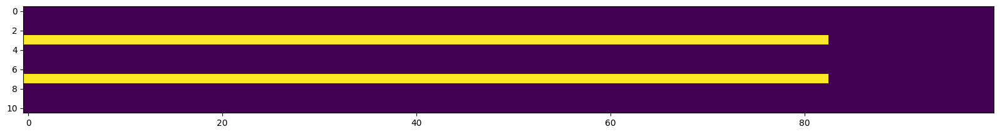

In [556]:
# the visibility matrix
plt.figure(figsize=(20,10))
plt.imshow((mm.point3d_camera_visibility > 0)[:,:100])

Show the points reprojected alongside the originals, any strong deviation here will suggest a bug

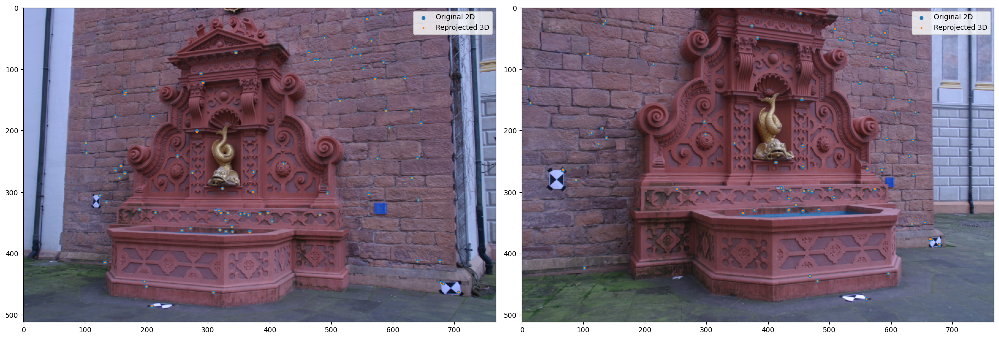

In [557]:
# again here's provided code to visualize the 3D points and the reprojection error
# use this to verify that your code is working correctly
%matplotlib inline
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(images[3])
plt.scatter(mpts01o[:,0],mpts01o[:,1],label='Original 2D', s=20)
plt.scatter(projPts2dLeft[:,0,0],projPts2dLeft[:,0,1],label='Reprojected 3D',s=3)
plt.legend()

plt.subplot(1,2,2)
plt.imshow(images[7])
plt.scatter(mpts10o[:,0],mpts10o[:,1],label='Original 2D', s=20)
plt.scatter(projPts2dRight[:,0,0],projPts2dRight[:,0,1],label='Reprojected 3D',s=3)
plt.legend()
plt.tight_layout()

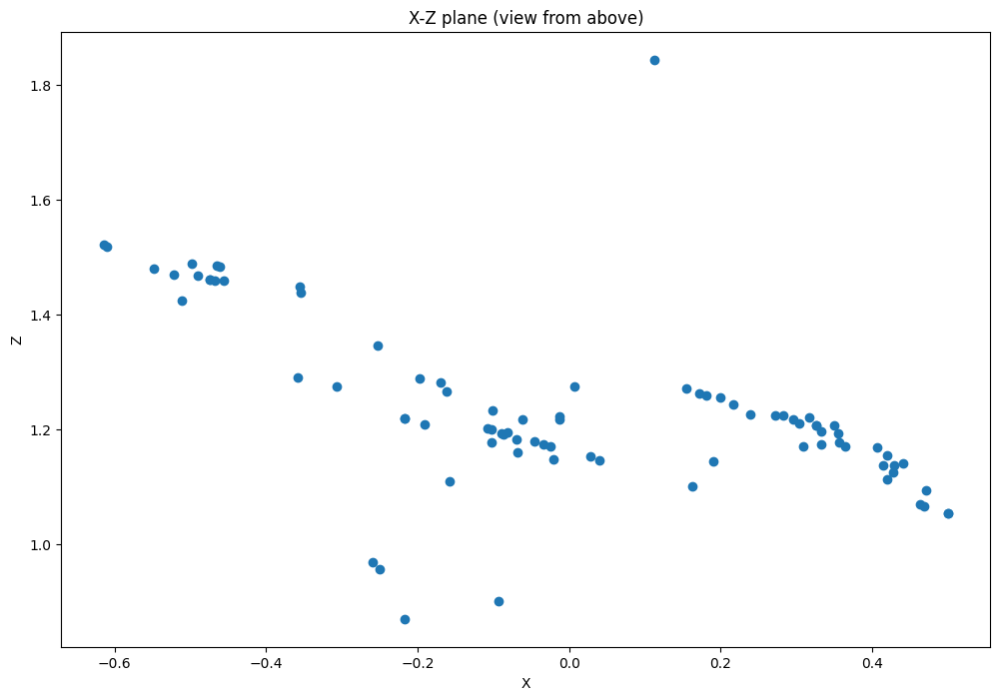

In [558]:
plt.scatter(pts3d[:,0],pts3d[:,2])
plt.xlabel('X')
plt.ylabel('Z')
plt.title('X-Z plane (view from above)');

We can see the wall and the fountain basin coming out of it.

---
## 2. Incremental SfM
Add another camera to your reconstructed scene: 
1. Find matching 2D-3D points
1. Find camera pose with linear pose estimation
1. Triangulate additional 3D points with the new camera pose

### 2D-3D correspondences
Let's add the view #5. To find camera pose we need to get 2D-3D correspondences.
To get correspondences we go back to the original matching (Image 3 $\leftrightarrow$ Image 7), and select the 2D points in Image 3 (which created 3D points with Image 7) intersected with 2D points in Image 5.

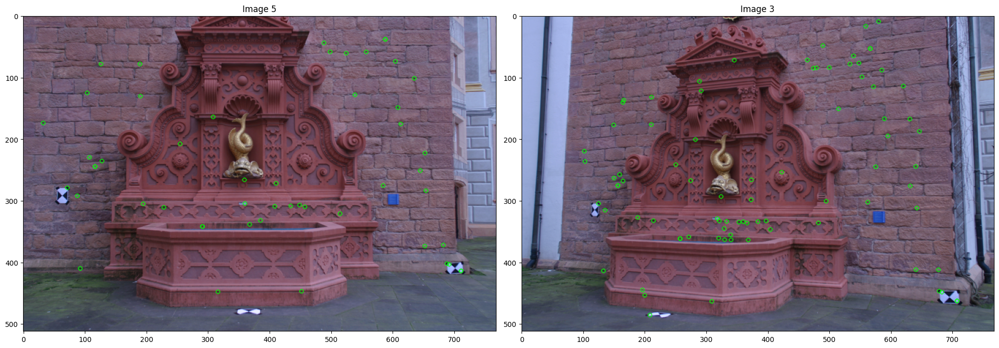

In [559]:
# let's get an aligned set of points from the graph and visualize them
selected_3_kpts, selected_5_kpts = mm.alignedKptsTo3DMap(3, 5)

img_5 = cv2.drawKeypoints(images[5], selected_5_kpts, None, color=(0, 255, 0), flags=0)
img_3 = cv2.drawKeypoints(images[3], selected_3_kpts, None, color=(0, 255, 0), flags=0)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(img_5)
plt.title('Image 5')
plt.subplot(1,2,2)
plt.imshow(img_3)
plt.title('Image 3')
plt.tight_layout()

seeing the two views and their points make sense is an important step for verification.

### Camera pose - the linear method
Remember, as per usual we start from
$$
\lambda\begin{bmatrix}x\\y\\1\end{bmatrix}
=
\begin{bmatrix}f_x & 0 & c_x\\0 & f_y & c_y \\0 & 0 & 1\end{bmatrix}
\begin{bmatrix}
r_1 & r_2 & r_3 & t_x\\
r_4 & r_5 & r_6 & t_y\\
r_7 & r_8 & r_9 & t_z\\
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}
$$
Multiply on left with $K^{-1}$ (essentially use normalized coordinates) and rearrange (after finding $\lambda$):
$$
\displaystyle
\begin{bmatrix}
x'(r_7X+r_8Y+r_9Z+t_z)\\
y'(r_7X+r_8Y+r_9Z+t_z)
\end{bmatrix}
=
\begin{bmatrix}
r_1 & r_2 & r_3 & t_x\\
r_4 & r_5 & r_6 & t_y
\end{bmatrix}
\begin{bmatrix}X\\Y\\Z\\1\end{bmatrix}
$$
Which leads, with further rearrangement, to an $Ab=0$ homogeneous system of equations to find $R,t$:
$$
\begin{bmatrix}
\cdots \\
X_i & Y_i & Z_i & 1 & 0    & 0    & 0    & 0  & -x'_iX_i & -x'_iY_i & -x'_iZ_i & -x'_i  \\
0    & 0    & 0    & 0  & X_i & Y_i & Z_i & 1 & -y'_iX_i & -y'_iY_i & -y'_iZ_i & -y'_i \\
\cdots 
\end{bmatrix}
\begin{bmatrix}
r_1 \\ r_2 \\ r_3 \\ t_x \\ r_4 \\ r_5 \\ r_6 \\ t_y \\ r_7 \\ r_8 \\ r_9 \\ t_z
\end{bmatrix}
= 0
$$
Which we can solve by solving the "minimal direction problem" ($\hat{b} = \mathop{\arg\min}_b|Ab|^2 \,\,\,\,\, \mathrm{s.t.} \,\,\, |b|=1
$), which essentially means we take the SVD: $A=U\Sigma V^\top$, and take as the solution the last row of $V^\top$, and (according to this formulation) simply reshape it $3\times4$ to obtain P.

However, the calculated matrix $P$ can take on an arbitrary scale, so the $R_{3\times3}$ matrix may need some conditioning to become a true rotation (orthonormal), effectively removing the scaling factor. Therefore we take the SVD and omit the scaling matrix $\Sigma$:
$$
\begin{align}
R &= U\Sigma V^\top\\
\hat{R} &= UV^\top
\end{align}
$$
When we do that we need to impose the same rescaling on the translation: $\hat{t} = t\cdot\sum \hat{R}/R$

In [560]:
# write a function that takes in a set of 2D-3D correspondences and returns the camera pose
# this function should use the DLT (direct linear transform) algorithm we wrote above
# populate the A matrix with 2 entries from each correspondence according to the equations above
# then use SVD to solve for the camera pose P (3x4 matrix). 
# the pose would be the last column of the V matrix from the decomposition of A (i.e. V[:,-1]).
# if the Rotation component (left 3x3 submatrix) of the 3x4 pose matrix has a negative determinant, 
# multiply it by -1
# apply the method above to make sure the rotation is orthonormal. take its SVD and reassemble
# the rotation matrix from the U and V matrices (e.g. R_conditioned = U @ V^T)
# scale the translation (the 3x1 right submatrix of P) by the sum (R_conditioned / R)
# return R_conditioned, t_conditioned
def calculateCameraPose(corresp2D3D_):
    A = []
    for c in corresp2D3D_:
        x, y, _ = c[0]
        X, Y, Z = c[1]

        A.append([X, Y, Z, 1, 0, 0, 0, 0, -x*X, -x*Y, -x*Z, -x])
        A.append([0, 0, 0, 0, X, Y, Z, 1, -y*X, -y*Y, -y*Z, -y])

    A = np.array(A, dtype=np.float64)

    _, _, VT = np.linalg.svd(A)
    P = VT[-1].reshape(3, 4)

    R = P[:, :3]
    t = P[:, 3:].copy()

    if np.linalg.det(R) < 0:
        R = -R
        t = -t

    U_r, _, VT_r = np.linalg.svd(R)
    R_conditioned = U_r @ VT_r

    # Match translation scale to the conditioned rotation
    scale = np.sum(R_conditioned / (R + 1e-12))
    t_conditioned = t * scale

    return R_conditioned, t_conditioned


Again we use a "RANSAC" type method to find a robust solution while weeding out the outliers. We take a lax margin for inlier inclusion.

In [563]:
# get the 2D-3D correspondences from the graph (as well as "backmapping" so we know how to map back 
# to the originating 2D points).
VIEW = 5

# --- Prerequisite: the sparse map must be built before this cell (cannot be fixed by RANSAC code alone) ---
if mm.map_3d is None:
    raise RuntimeError(
        "mm.map_3d is None. Run the notebook from the top through the stereo / triangulation cells."
    )
if mm.map_3d.shape[0] == 0:
    raise RuntimeError(
        "mm.map_3d has 0 points. Run the section that triangulates a stereo pair and calls "
        "mm.addNewPoints3D(pts3d, left_idx, right_idx, mask) (in this HW that fills the map from images 3 and 7). "
        "Use Kernel -> Restart & Run All, or execute every cell above this one in order, then re-run this cell."
    )

# MatchMaker reserves only 500 columns for point3d_camera_visibility; pad so it matches map size.
def _pad_visibility_to_map(mm):
    n_map = mm.map_3d.shape[0]
    vis = mm.point3d_camera_visibility
    if vis is None:
        return
    if n_map > vis.shape[1]:
        pad_w = n_map - vis.shape[1]
        mm.point3d_camera_visibility = np.pad(vis, ((0, 0), (0, pad_w)), constant_values=-1)

_pad_visibility_to_map(mm)

if VIEW >= len(mm.kpts):
    raise RuntimeError(
        f"VIEW={VIEW} but there are only {len(mm.kpts)} images (use index 0..{len(mm.kpts)-1})."
    )

correspond2D3D, backmapping = mm.aligned2D3D(VIEW)

def _build_from_visibility(mm, view):
    """Direct 2D-3D using mm.point3d_camera_visibility[view, pid]."""
    m2d, m3d, bm = [], [], []
    n_pts = mm.map_3d.shape[0]
    n_vis = min(n_pts, mm.point3d_camera_visibility.shape[1])
    for pid in range(n_vis):
        kidx = int(mm.point3d_camera_visibility[view, pid])
        if kidx >= 0:
            pt = mm.kpts[view][kidx].pt
            m2d.append((float(pt[0]), float(pt[1]), 1.0))
            m3d.append(mm.map_3d[pid])
            bm.append((pid, kidx))
    if not m2d:
        return None
    return np.stack([m2d, m3d], axis=1), bm

def _build_via_graph_to_view(mm, view):
    """For each map point: any other camera j sees it and kpts_match_graph links j -> view."""
    m2d, m3d, bm = [], [], []
    n_pts = mm.map_3d.shape[0]
    n_vis = min(n_pts, mm.point3d_camera_visibility.shape[1])
    for pid in range(n_vis):
        for j in range(len(mm.kpts)):
            if j == view:
                continue
            kj = int(mm.point3d_camera_visibility[j, pid])
            if kj < 0:
                continue
            kv = int(mm.kpts_match_graph[j, view, kj])
            if kv >= 0:
                pt = mm.kpts[view][kv].pt
                m2d.append((float(pt[0]), float(pt[1]), 1.0))
                m3d.append(mm.map_3d[pid])
                bm.append((pid, kv))
                break
    if not m2d:
        return None
    return np.stack([m2d, m3d], axis=1), bm

# Fall back if aligned2D3D is empty (e.g. sparse graph) or would be invalid on empty stacks.
if len(correspond2D3D) == 0:
    out = _build_from_visibility(mm, VIEW)
    if out is None:
        out = _build_via_graph_to_view(mm, VIEW)
    if out is not None:
        correspond2D3D, backmapping = out
        print(f"aligned2D3D was empty; using {len(correspond2D3D)} correspondences (fallback) for view {VIEW}.")

# the correspond2D3D array is a 3D array of shape (N,2,3) where N is the number of 2D-3D correspondences
# the first index is the correspondence pair index
# the second index is 0 for the 2D point (homogeneous, so it's 1x3) and 1 for the 3D point (1x3)
# for example correspond2D3D[0,0] is the 2D point and correspond2D3D[0,1] is the 3D point

# here's another opportunity to use the RANSAC algorithm to find the best camera pose
# use the function you wrote above to calculate the camera pose for a random sample of 6 correspondences
# then find the inliers (2D points that are within 25 pixels of the reprojected 3D points)
# using cv2.projectPoints, and np.linalg.norm (and .squeeze() as needed).
# the best camera pose is the one with the most inliers (use the maxv variable below to keep track of this)
# save the final camera pose in R_final and t_final
maxv = 0
R_final = t_final = None

corr = np.asarray(correspond2D3D, dtype=object)
n_corr = len(corr)
if n_corr < 6:
    n_map = mm.map_3d.shape[0]
    vis5 = mm.point3d_camera_visibility[VIEW, : min(n_map, mm.point3d_camera_visibility.shape[1])]
    n_vis5 = int(np.sum(vis5 >= 0))
    raise RuntimeError(
        f"Need at least 6 correspondences for RANSAC; got {n_corr}. "
        f"(map_3d points={n_map}, view {VIEW} keypoint assignments: {n_vis5}). "
        "If map_3d>0 but this is still low, run cells that add visibility for camera 5. "
        "Otherwise run the notebook from the top through triangulation / mm.addNewPoints3D."
    )

pts2d_all = np.array([np.asarray(c[0])[:2] for c in corr], dtype=np.float64)
pts3d_all = np.array([np.asarray(c[1])[:3] for c in corr], dtype=np.float64)

for i in range(25000):
    idx = np.random.choice(n_corr, 6, replace=False)
    R_try, t_try = calculateCameraPose(corr[idx])

    rvec, _ = cv2.Rodrigues(R_try)
    tvec = np.asarray(t_try, dtype=np.float64).reshape(3, 1)
    proj, _ = cv2.projectPoints(pts3d_all.astype(np.float64), rvec, tvec, K, None)
    proj = proj.squeeze()

    err = np.linalg.norm(proj - pts2d_all, axis=1)
    inliers = err < 25
    v = np.count_nonzero(inliers)

    if v > maxv:
        maxv = v
        R_final = R_try
        t_final = np.asarray(t_try).reshape(3,)
        print(maxv)


2


In [564]:
# pritnt your results
R_final,t_final

(array([[ 0.88751258,  0.41784207,  0.19424066],
        [-0.43581628,  0.89807272,  0.05941014],
        [-0.14961818, -0.13738049,  0.97915321]]),
 array([-0.00070444,  0.02135196,  0.00083025]))

In [565]:
# again compare your results to OpenCV's solvePnPRansac function
# you rsults should be very similar, but not exactly the same. a small difference is expected
# you very well can run the RANSAC loop above multiple times and get other reuslts
_,r_cv,t_cv,inliers_cv = cv2.solvePnPRansac(correspond2D3D[:,1], correspond2D3D[:,0,:2], K, None)
print(cv2.Rodrigues(r_cv)[0], t_cv.T, len(inliers_cv))

[[ 0.92923577 -0.02508356 -0.36863491]
 [ 0.00900084  0.99893365 -0.04528304]
 [ 0.36937767  0.0387606   0.92847065]] [[0.51487461 0.00596592 0.03714066]] 53


Make sure the process above finds > 30% of the points as inliers. If it doesn't - run it again, it's a game of chance.

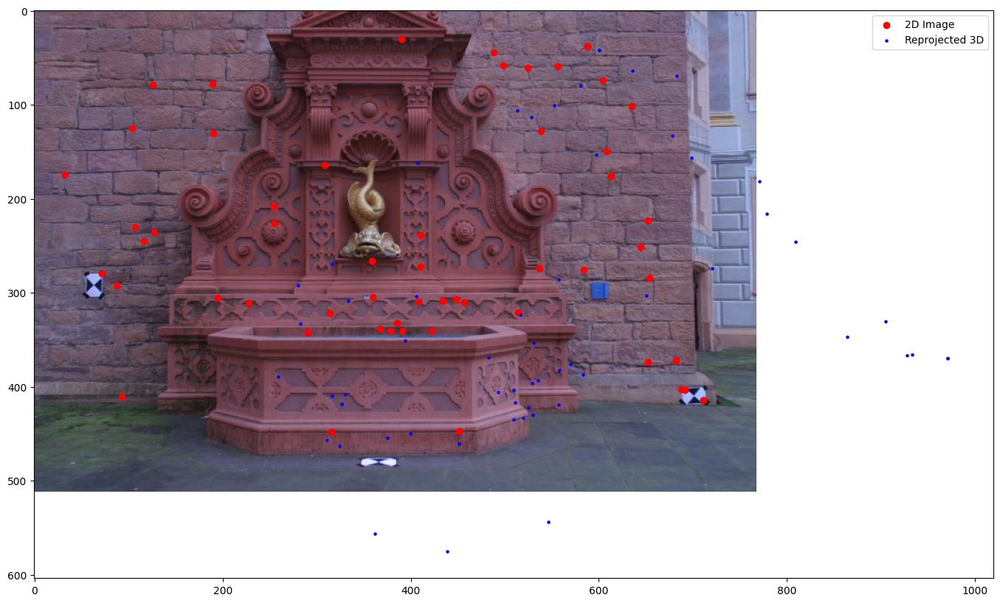

In [566]:
# here's a visualization of the 2D-3D correspondences and the reprojected 3D points
# the red points are the 2D points and the blue points are the reprojected 3D points
# the reprojected 3D points should be close to the 2D points - but we gave it a good margin of 25 pixels
# so we expect some of the blue points to be outside the red points.
# outliars are points that are very far from the reprojected 3D points
projPts2d2,_ = cv2.projectPoints(correspond2D3D[:,1].T, R_final,t_final, K, None)

plt.figure(figsize=(20,10))
plt.imshow(images[5])
plt.scatter(correspond2D3D[:,0,0],correspond2D3D[:,0,1],label='2D Image', c='r')
plt.scatter(projPts2d2[:,0,0],projPts2d2[:,0,1],label='Reprojected 3D',c='b',s=5)
plt.legend();

That looks pretty bad doesn't it!

We can do much better with the following step...

Luckily (here is the power of non-linear optimization), if the initial solution is even remotely close (such as the case above), we can make pretty big steps towards a far better solution.

#### Camera Pose Non-Linear Optimization

This time we complement with a non-linear least squares optimization, with a huber loss to help further with outliers, to minimize the reprojection loss: 
$$
\displaystyle
\hat{P} = \mathop{\arg\min}_{P} \sum_i \Vert \mathrm{Proj}(P,X_i^{\mathrm{3D}}) - x_i^{\mathrm{2D}} \Vert
$$

In [567]:
def calcResiduals(Rt):
    # split rotation and translation
    r_vec = Rt[:3].reshape(3, 1)
    t_vec = Rt[3:].reshape(3, 1)
    #r_vec = Rt[0:3].reshape(3, 1)
    #t_vec = Rt[3:0].reshape(3, 1)

    # reproject 3D points to 2D
    pReproj2D, _ = cv2.projectPoints(
        correspond2D3D[:, 1].astype(np.float64),
        r_vec,
        t_vec,
        K,          # use existing intrinsic matrix
        None
    )

    # reshape to (N, 2)
    pReproj2D = pReproj2D.reshape(-1, 2)

    # original 2D points
    p2D = correspond2D3D[:, 0, :2]

    # compute residuals (IMPORTANT: component-wise, not norm)
    residuals = p2D - pReproj2D

    return residuals.ravel()


# use scipy least squares to refine the pose estimate (scipy.optimize.least_squares)
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.least_squares.html
# however this time we will use a robus method (Huber loss function, e.g. loss='huber') to deal with outliers, as well as use
# an iterative solver which works with the residuals.
# the parameters to optimize are the rotation vector and the translation vector - in rodrigues form (cv2.Rodrigues)
# stack them together (hstack) and use the ravel() function to convert to a 1D array, this will be the input to the
# calcResiduals function you defined above.

Rt_init = np.hstack((r_cv.ravel(), t_cv.ravel()))

res = scipy.optimize.least_squares(
    calcResiduals,
    Rt_init,
    loss='huber'
)

Rt_opt = res.x
rvec_opt = Rt_opt[:3].reshape(3, 1)
tvec_opt = Rt_opt[3:].reshape(3, 1)

In [568]:
# extract the solution from the least squares function's result
R2 = cv2.Rodrigues(res.x[:3])[0]
t2 = res.x[3:]



In [569]:
# our optimized pose
R2, t2

(array([[ 0.92926576, -0.02505263, -0.36856142],
        [ 0.00952133,  0.9989906 , -0.04389905],
        [ 0.36928918,  0.03728469,  0.92856629]]),
 array([0.5146724 , 0.00418541, 0.03678511]))

In [570]:
# compare again to the OpenCV solution (r_cv, t_cv) and see that now they are virtually the same
# the difference should now be very very small.
cv2.Rodrigues(r_cv)[0], t_cv.T

(array([[ 0.92923577, -0.02508356, -0.36863491],
        [ 0.00900084,  0.99893365, -0.04528304],
        [ 0.36937767,  0.0387606 ,  0.92847065]]),
 array([[0.51487461, 0.00596592, 0.03714066]]))

Display the new projected points to verify the solution

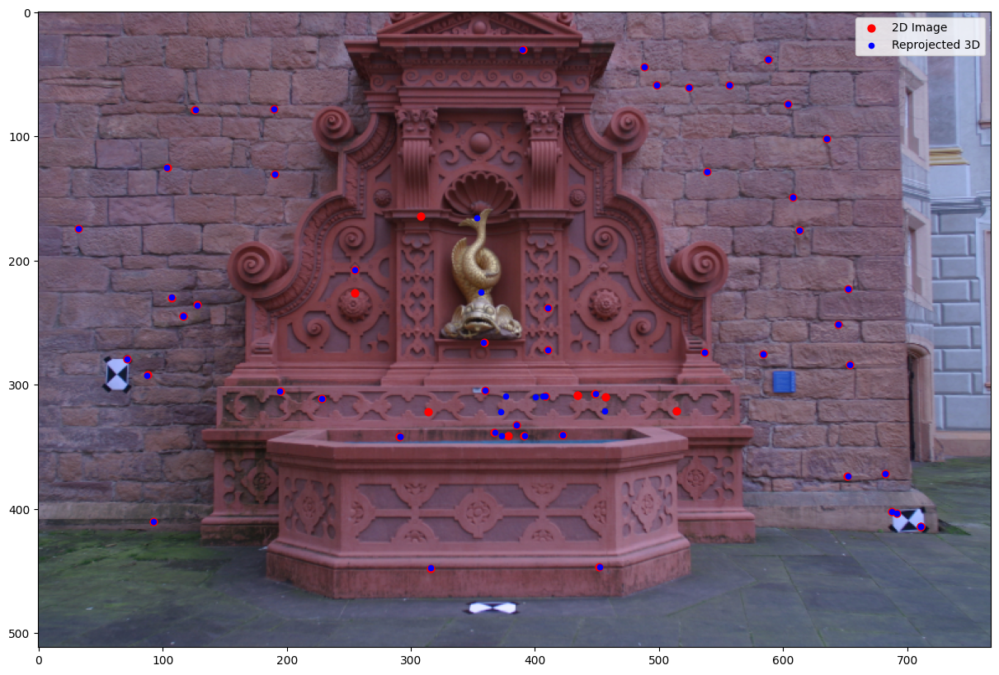

In [571]:
# let's visualize the results again to see how well the reprojected 3D points match the 2D points
projPts2d2,_ = cv2.projectPoints(correspond2D3D[:,1].T, R2, t2, K, None)

plt.figure(figsize=(20,10))
plt.imshow(mm.images[5])
plt.scatter(correspond2D3D[:,0,0],correspond2D3D[:,0,1],label='2D Image', c='r', s=40)
plt.scatter(projPts2d2[:,0,0],projPts2d2[:,0,1],label='Reprojected 3D', c='b', s=20)
plt.legend();

Now that looks much better!

In [572]:
# this is code provided to you to add the camera pose to the map.

# add the camera pose to the map
mm.poses[5] = np.hstack([R2,t2[np.newaxis].T])

# add this view to the visibility graph match_graph_3d[5], where the reprojection 
# error is small (3d points we are confident are viewable from camera 5)
projPts2d2,_ = cv2.projectPoints(correspond2D3D[:,1].T, mm.R(5), mm.t(5), K, None)
for i in range(len(projPts2d2)):
    if np.linalg.norm(np.squeeze(projPts2d2[i]) - correspond2D3D[i,0,:2]) < 5:
        mm.point3d_camera_visibility[5, backmapping[i][0]] = backmapping[i][1]

Let's have a look at the 3D point visibility map. Now we've added camera 5, it overlaps with some of the points, but some were thrown out because they're outliers.

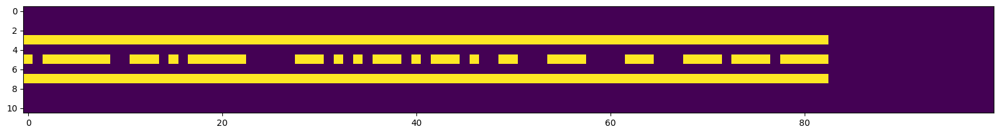

In [573]:
plt.figure(figsize=(20,10))
plt.imshow((mm.point3d_camera_visibility > 0)[:,:100])

### Triangulate more points

Now that we found the pose for camera 5, let's add more 3D points to the reconstruction that come from the pairs: 3-5, and 5-7 (but don't already exist in the current 3-5-7 map)

In [574]:
# let's get aligned 2D points from 3,5 views that are not in the map
# the backidxL and backidxR are the indices of the 2D points in the original keypoint arrays in the map
pt2dl, pt2dr, backidxL, backidxR = mm.aligned2DNotInMap(3, 5)

In [575]:
# now use cv2.triangulatePoints to triangulate the 2D points.
# you will need to convert the 2D points to normalized coordinates before triangulation
# that is, multiply on the left by the inverse of the camera matrix Kinv: 
#   np.matmul(Kinv, cv2.convertPointsToHomogeneous(pt2d).squeeze().T).T
# the output of cv2.triangulatePoints is in homogeneous coordinates, so you will need to convert it to
# euclidean coordinates using cv2.convertPointsFromHomogeneous.
# make sure your final output is a 3xN array (N is the number of points)

# inverse
Kinv = np.linalg.inv(K)

# your 2D correspondences (left / right views)
#
# pt2dl 
# pt2dr 

#normalize 
ptsL_norm = (Kinv @ cv2.convertPointsToHomogeneous(pt2dl).squeeze().T).T
ptsR_norm = (Kinv @ cv2.convertPointsToHomogeneous(pt2dr).squeeze().T).T

#triangulate using the CORRECT projection matrices (from your pipeline)
pts4D = cv2.triangulatePoints(
    mm.poses[3],   #first camera projection matrix
    mm.poses[5],   #second camera projection matrix
    ptsL_norm[:, :2].T,
    ptsR_norm[:, :2].T
)

#to Euclidean coords
#pts3d = cv2.convertPointsFromHomogeneous(pts4D.T).reshape(-1, 3)
pts3d = cv2.convertPointsFromHomogeneous(pts4D.T).squeeze()

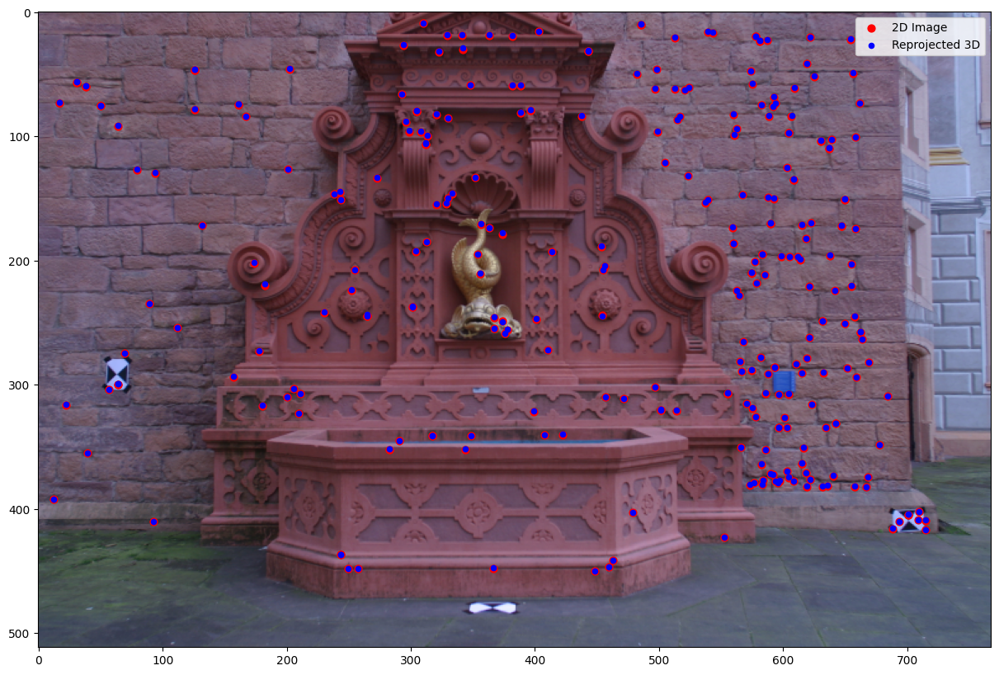

In [576]:
# here is some code to visualize the results
# the blue points are the reprojected 3D points triangulated from the 2D
# the red points are the original image 2D points
projPts2d2,_ = cv2.projectPoints(pts3d, mm.R(5), mm.t(5), K, None)

plt.figure(figsize=(20,10))
plt.imshow(mm.images[5])
plt.scatter(pt2dr[:,0],pt2dr[:,1],label='2D Image', c='r', s=40)
plt.scatter(projPts2d2[:,0,0],projPts2d2[:,0,1],label='Reprojected 3D', c='b', s=20)
plt.legend();

In [577]:
# append the new 3D points to the map
M, N = mm.map_3d.shape[0], pts3d.shape[0]
mm.point3d_camera_visibility[3, M:M+N] = backidxL
mm.point3d_camera_visibility[5, M:M+N] = backidxR
mm.map_3d = np.vstack([mm.map_3d, pts3d.squeeze()])

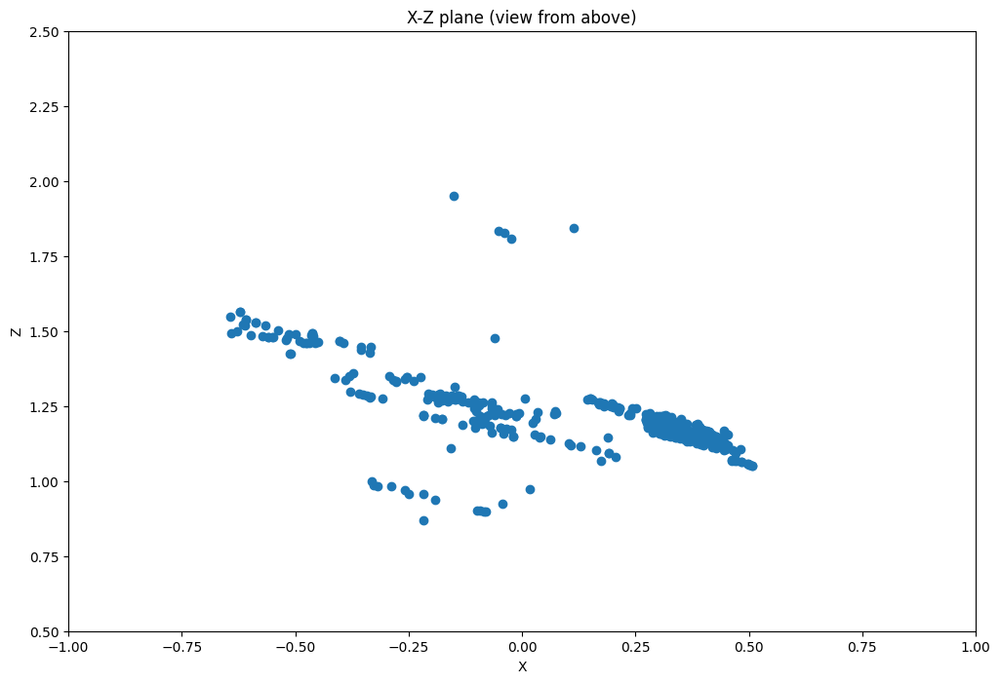

In [578]:
# visualize the map
plt.scatter(mm.map_3d[:,0],mm.map_3d[:,2])
plt.xlim(-1,1)
plt.ylim(0.5,2.5)
plt.xlabel('X')
plt.ylabel('Z')
plt.title('X-Z plane (view from above)');

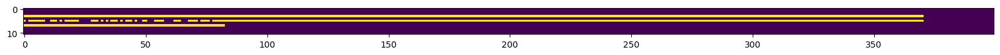

In [579]:
# and the visibility graph
plt.figure(figsize=(20,10))
plt.imshow((mm.point3d_camera_visibility > 0)[:,:400])

---
## 3. Bundle Adjustment

Write a bundle adjuster to optimize the reconstruction in Q.2: Find the optimal camera intrinsics, extrinsics (camera pose) and 3D points, such that the reprojection error (where there is visibility, guarded by $w_{ij}$) is minimal:
$$
\hat{X}, \hat{C}, \hat{K} = \mathop{\arg\min}_{X,C,K} \sum_j^M \sum_i^N w_{ij} \left\Vert \mathrm{Proj}(X_i^\mathrm{(3D)},C_j,K) - x_i^\mathrm{(2D)} \right\Vert^2
$$

Assume:
1. All cameras have the same K matrix
2. Pixels are square ($f_x = f_y$)
3. There is no skew ($K_{0,1} = 0$)

Pack all the parameters for this reconstruction into a single (very long) vector like so:
$$
\left[R^0_{1\times3}, R^1_{1\times3}, R^2_{1\times3}, t^0_{1\times3}, t^1_{1\times3}, t^2_{1\times3}, f, c_x, c_y, p^{0}_{\mathrm{3D}},\dots,p^{N}_{\mathrm{3D}}\right]
$$
Rotation matrices $3\times3$ should be converted to Rodrigues formula $1\times3$ (`cv2.Rodrigues(...)[0]`).

In [580]:
map_3d, mpts2DForViews, visibility = mm.alignedMapTo2DAndVisibility()

In [581]:
# create the vector of parameters for initialization
n_cams = 3
cam_ids = [3,5,7]
n_pts = mm.map_3d.shape[0]
params_size = n_cams * 6 + n_pts * 3 + 3

x0 = np.zeros((params_size,), np.float32) 

K_idx = n_cams * 6

# fill in camera rotations and translations
for j, camId in enumerate(cam_ids):
    rvec, _ = cv2.Rodrigues(mm.R(camId))
    x0[j*6 : j*6+3] = rvec.ravel()
    x0[j*6+3 : j*6+6] = mm.t(camId).ravel()

# fill in intrinsics
x0[K_idx + 0] = K[0, 0]  # f
x0[K_idx + 1] = K[0, 2]  # cx
x0[K_idx + 2] = K[1, 2]  # cy

# fill in 3D points
pts_start = K_idx + 3
for i in range(n_pts):
    x0[pts_start + i*3 : pts_start + i*3 + 3] = mm.map_3d[i]

This function calculates the residuals vector, e.g. $\left[\dots,r_{ji}^x,r_{ji}^y,\dots\right]$ where $r_{ji} = \left(\mathrm{Proj}(P^{\mathrm{3D}}_i,C_j,K)-p^{\mathrm{2D}}_i\right)$, unpacking the parameters for $P^{\mathrm{3D}}_i,C_j,K$ from the `params` vector, and taking the 2D point $p^{\mathrm{2D}}_i$ from the `pts2d` argument. The shape of the residuals vector is $1\times2N$, where $N$ is the number of points. 

In [582]:
# this function will be called by the optimizer to calculate the reprojection error (residuals)
# the "params" vector contains the camera poses and 3D points flattened into a single vector
# the "n_cams" and "n_pts" variables are the number of cameras and 3D points in the map
# the "cam_ids" are camera ids (e.g. [3,5,7]), so we can iterate [0]->3, [1]->5, [2]->7
# the "pts2d" are image 2D points that we want to compare to the reprojection (some of them are "empty")
# the "visibility" is a matrix that indicates which 3D points are visible from which camera
# the optimization cannot change "pts2d" and "visibility", these are our "truth"
# the "show_debug" variable is used to visualize the reprojection error
# the function returns a residual vector of the reprojection error (`a - b`) for each 2D point
def calcResidualsBA(params, n_cams, n_pts, cam_ids, pts2d, visibility, show_debug=False):
    # unpack the camera poses and 3D points from the "params" vector
    # params = [R1 (1x3), t1 (1x3), ..., Rn (1x3), tn (1x3), f, cx, cy, X1, Y1, Z1, ..., Xn, Yn, Zn]
    # a total of 6*n_cams + 3 + 3*n_pts parameters
    K_idx = n_cams * 6
    pts_start = K_idx + 3
 
    # extract camera poses
    Rs = [params[j*6 : j*6+3] for j in range(n_cams)]
    ts = [params[j*6+3 : j*6+6] for j in range(n_cams)]
 
    # extract intrinsics
    f  = params[K_idx + 0]
    cx = params[K_idx + 1]
    cy = params[K_idx + 2]
    K_ = np.array([[f, 0, cx],
                    [0, f, cy],
                    [0, 0,  1]])
 
    # extract 3D points
    pts3d = params[pts_start:].reshape(n_pts, 3)
 
    resid = []
 
    if show_debug:
        plt.figure(figsize=(20, 5))
 
    for i in range(n_cams):
        proj, _ = cv2.projectPoints(pts3d, Rs[i], ts[i], K_, None)
        proj = proj.squeeze()
 
        if show_debug:
            plt.subplot(1, n_cams, i + 1)
            plt.imshow(mm.images[cam_ids[i]])
            plt.title(f'Camera {cam_ids[i]}')
 
        for j in range(n_pts):
            if visibility[cam_ids[i]][j] == 1:
                err = pts2d[cam_ids[i], j] - proj[j]
                resid.append(err)
                if show_debug:
                    plt.scatter(pts2d[cam_ids[i], j, 0], pts2d[cam_ids[i], j, 1], c='g', s=3)
                    plt.scatter(proj[j, 0], proj[j, 1], c='r', s=3)
            else:
                resid.append(np.array([0.0, 0.0]))
 
    return np.hstack(resid)

This builds the sparsity matrix of the jacobian (partial derivative matrix), which greatly increases the speed of optimization. We let the optimizer calculate the jacobian by itself numerically (by adding small $\Delta$s to the parameters), which is a costly operation, therefore we guide it by saying what elements of the jacobian matrix will always be 0 and never have to be calculated. 

For each 2D point residual, many parameters for optimization in the system are irrelevant, and in fact a 2D residual is derived from just a handful of parameters: $K,C_j,P^{\mathrm{3D}}_i$, therefore the jacobian is very sparse. 

In [583]:
from scipy.sparse import lil_matrix

# this function creates a sparse matrix that indicates which parameters affect which residuals
# this is used by the optimizer to speed up the calculation
# the "n_cams" and "n_pts" variables are the number of cameras and 3D points in the map
# the "cam_ids" are camera ids (e.g. [3,5,7]), so we can iterate [0]->3, [1]->5, [2]->7
# the "visibility" is a matrix that indicates which 3D points are visible from which camera,
#   this is used to determine which residuals are affected by which parameters.
# total number of potential residuals (some will be zero) = n_cams * n_pts * 2
# total number of parameters = n_cams * 6 + n_pts * 3 + 3

# so build a sparse matrix (`lil_matrix`) A of size (n_cams * n_pts * 2) x (n_cams * 6 + n_pts * 3 + 3)
# in the residual vector, the camera parameters take up the first 6*n_cams parameters
# the intrinsic parameters take up the next 3 parameters, starting at 6*n_cams
# the 3D points take up the next 3*n_pts parameters, starting at 6*n_cams + 3.
# to figure out where in the residual vector each parameter affects, use the following scheme:
#   each residual (reprojection) is effected by the camera pose (R,t) that it was projected from
#   each residual is also effected by the 3D point that was projected
#   each residual is also effected by the intrinsic parameters (f, cx, cy)
# the poses, 3d points and intrinsics are stored in the "params" vector in the order that we've
#   described above, so you can use the same indexing scheme to figure out where each parameter.
# 
# for example, a point `i`` in camera `j`` will affect sparsity matrix at 
#   rows: `2*i + j*n_pts*2` and `2*i + j*n_pts*2 + 1`
#   columns: `j*3` -> `j*3 + 3` (the 3 parameters of the camera rotation)
#            `ts_ids + j*3` -> `ts_ids + j*3 + 3` (the 3 parameters of the camera translation)
#            `K_idx` -> `K_idx + 3` (the 3 parameters of the intrinsics)
#            `pts3d_idx + i*3` -> `pts3d_idx + i*3 + 3` (the 3 parameters of the 3D point)
#
# sparse non-linear optimization problems are not easy to set up. so pay attention to the details.
def bundle_adjustment_sparsity(n_cams, n_pts, cam_ids, visibility):
    m = n_cams * n_pts * 2
    n = n_cams * 6 + 3 + n_pts * 3
    A = lil_matrix((m, n), dtype=int)
 
    K_idx = n_cams * 6
    pts3d_idx = K_idx + 3
 
    for j in range(n_cams):
        for i in range(n_pts):
            if visibility[cam_ids[j]][i] == 1:
                row = 2 * i + j * n_pts * 2
 
                # camera rotation (3 params)
                A[row:row+2, j*6 : j*6+3] = 1
                # camera translation (3 params)
                A[row:row+2, j*6+3 : j*6+6] = 1
                # intrinsics (3 params)
                A[row:row+2, K_idx : K_idx+3] = 1
                # 3D point (3 params)
                A[row:row+2, pts3d_idx + i*3 : pts3d_idx + i*3+3] = 1
 
    return A

In [584]:
A = bundle_adjustment_sparsity(3, map_3d.shape[0], [3, 5, 7], visibility)

To illustrate the sparsity of the jacobian:

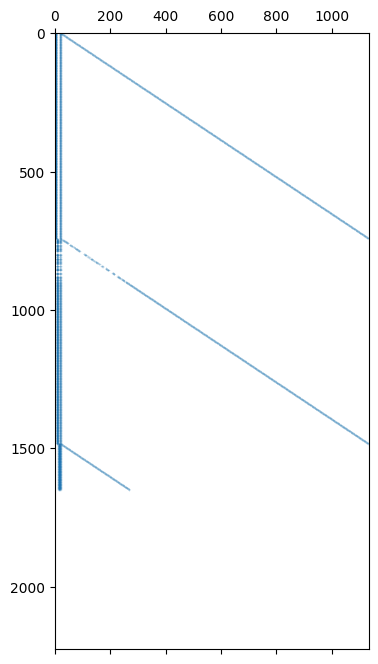

In [585]:
plt.spy(A,markersize=0.03);

Some parameters for optimization should be bound, and not be allowed to get extreme values. For example the focal length $f$ as well as $c_x,c_y$ cannot be negative, and $f$ should be capped above at e.g. 2000.

In [597]:
# set up bounds on the K (intrinsics parameters)
bounds = (np.full((params_size,),-np.inf),np.full((params_size,),np.inf))
bounds[0][K_idx:K_idx+3] = [100,0,0]
bounds[1][K_idx:K_idx+3] = [800,mm.images[0].shape[1],mm.images[0].shape[0]]

Run the NLLSQ optimizer:

In [598]:
res = scipy.optimize.least_squares(calcResidualsBA, x0, 
                                   jac_sparsity=A, 
                                   verbose=2, 
                                   x_scale='jac', 
                                   ftol=1e-5, 
                                   jac='3-point',
                                   bounds=bounds,
                                   args=(n_cams, n_pts, [3, 5, 7], mpts2DForViews, visibility, False))

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         8.6725e+01                                    9.68e+04    
       1              2         1.7750e+01      6.90e+01       3.28e-01       1.19e+02    
       2              3         1.7726e+01      2.34e-02       9.02e-01       2.62e+02    
       3              4         1.7716e+01      1.01e-02       4.93e-02       5.10e+01    
       4              5         1.7714e+01      1.88e-03       1.38e-01       7.26e+01    
       5              6         1.7713e+01      1.04e-03       3.10e-02       6.22e+01    
       6              7         1.7713e+01      3.43e-04       7.30e-03       2.18e+01    
       7              8         1.7713e+01      3.78e-04       1.79e-02       6.47e+01    
       8              9         1.7712e+01      3.13e-04       5.63e-03       1.82e+01    
       9             10         1.7712e+01      3.31e-04       1.82e-02       6.65e+01    

Lets have a look on the effect the optimization had on the residuals:

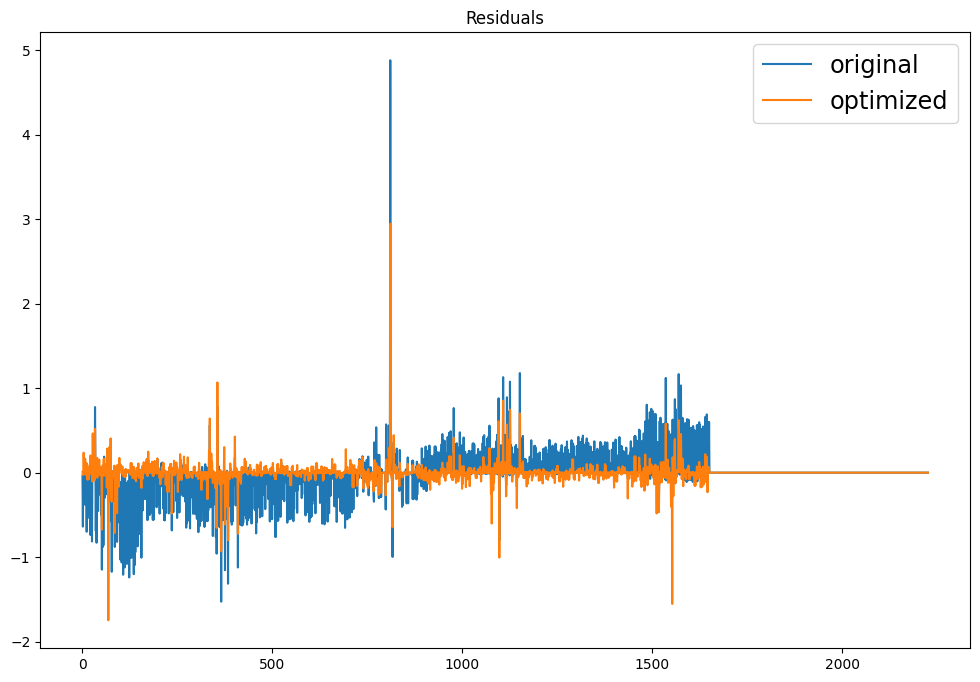

In [ ]:
plt.plot(calcResidualsBA(x0, n_cams, n_pts, [3, 5, 7], mpts2DForViews, visibility, False),label='original')
plt.plot(calcResidualsBA(res.x, n_cams, n_pts, [3, 5, 7], mpts2DForViews, visibility, False),label='optimized')
plt.title('Residuals')
plt.legend(fontsize='xx-large'); #graph seems to be inverse of what's expected... probably meant to flip a sign somewhere

Seems the residuals have mostly all improved.

Now visually on the images with the points projections:

<Figure size 2000x500 with 0 Axes>

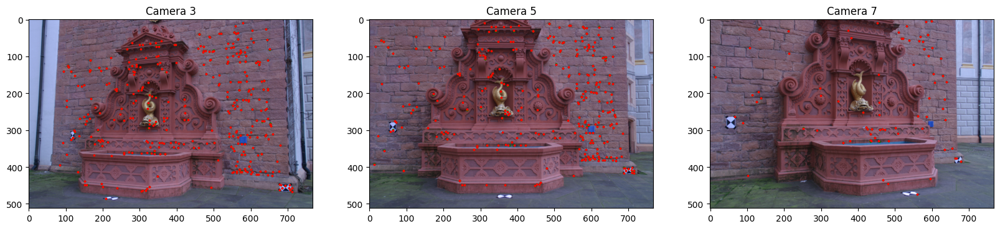

In [600]:
plt.figure(figsize=(20,5))
calcResidualsBA(res.x, n_cams, n_pts, [3, 5, 7], mpts2DForViews, visibility, True);
#with how long this took, i am pleasantly surprised with how good this looks

This looks much better than before, right?

Collect the optimized measurements from the parameters vector:

In [606]:
# unpack the results vector.
# save in the variables `pts3d_hat`, `ts_hat`, `Rs_hat`, `K_hat`
# the location of these parameters in the results vector is the same as in the sparsity matrix and as before.
K_idx = n_cams * 6
pts_start = K_idx + 3
 
Rs_hat = [cv2.Rodrigues(res.x[j*6 : j*6+3])[0] for j in range(n_cams)]
ts_hat = [res.x[j*6+3 : j*6+6] for j in range(n_cams)]
 
f_hat  = res.x[K_idx + 0]
cx_hat = res.x[K_idx + 1]
cy_hat = res.x[K_idx + 2]
K_hat  = np.array([[f_hat, 0, cx_hat],
                    [0, f_hat, cy_hat],
                    [0,     0,     1]])
 
pts3d_hat = res.x[pts_start:].reshape(n_pts, 3)
# verify
for j, camId in enumerate(cam_ids):
    print(f"Camera {camId}: R =\n{Rs_hat[j]}\n  t = {ts_hat[j]}")
print(f"\nK_hat =\n{K_hat}")
print(f"\npts3d_hat shape: {pts3d_hat.shape}, first 3 points:\n{pts3d_hat[:3]}")
print(f"\nOptimization cost: {res.cost:.4f}, status: {res.message}")

Camera 3: R =
[[ 9.99999783e-01  6.30974594e-04 -1.88020112e-04]
 [-6.31132652e-04  9.99999447e-01 -8.41776853e-04]
 [ 1.87488868e-04  8.41895336e-04  9.99999628e-01]]
  t = [ 0.00160528  0.0006803  -0.00138751]
Camera 5: R =
[[ 0.92973281 -0.02463671 -0.36740976]
 [ 0.00934174  0.99901628 -0.04334985]
 [ 0.36811633  0.03687154  0.92904836]]
  t = [0.5147226  0.00398126 0.03564607]
Camera 7: R =
[[ 0.73595396 -0.05882618 -0.67447109]
 [ 0.01102056  0.99712696 -0.07494249]
 [ 0.67694188  0.04772118  0.73448783]]
  t = [0.96532268 0.02042758 0.25768986]

K_hat =
[[688.36073056   0.         378.37851994]
 [  0.         688.36073056 251.13705491]
 [  0.           0.           1.        ]]

pts3d_hat shape: (371, 3), first 3 points:
[[-0.61472222 -0.06950375  1.52622722]
 [-0.61071176 -0.03296665  1.52159638]
 [-0.54760327  0.11527561  1.48210761]]

Optimization cost: 17.7046, status: `ftol` termination condition is satisfied.


Show the 3D points (top-view, XZ plane):

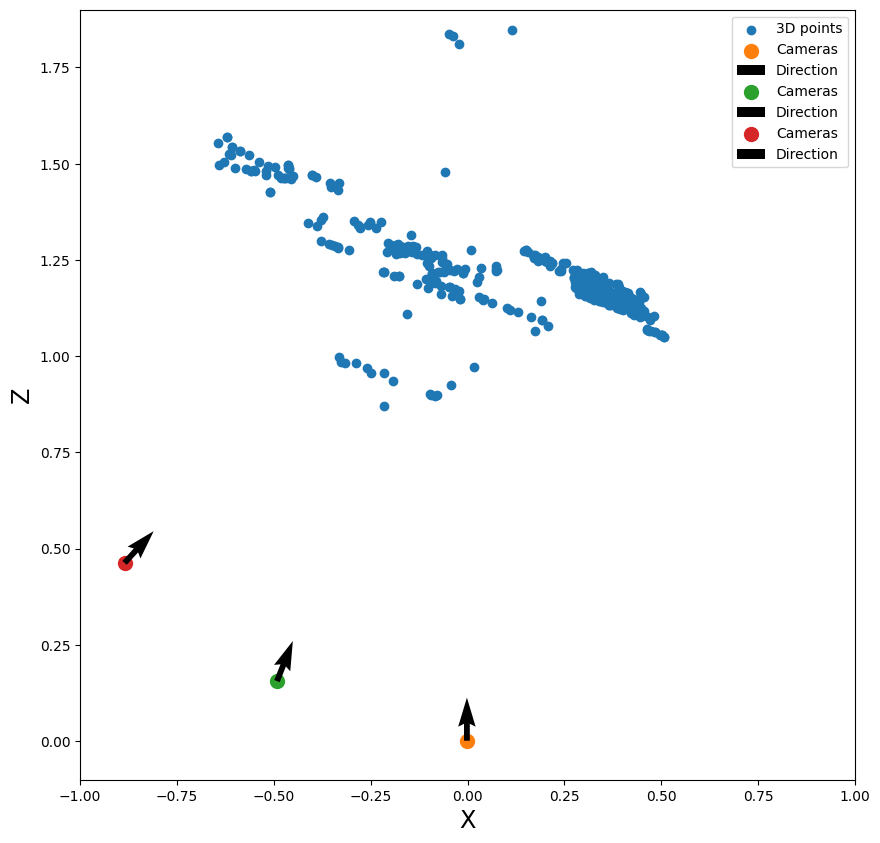

In [ ]:
# visualize the results to see if they make sense
#made a slight adjustment to fit my code
plt.figure(figsize=(10,10))
plt.scatter(pts3d_hat[:,0],pts3d_hat[:,2], label='3D points')
for cam_i in range(n_cams):
    Ri = Rs_hat[cam_i]          #made a slight adjustment to fit my code
    ti = ts_hat[cam_i].ravel()  # ensure 1D shape (3,)
    ti = -Ri.T @ ti
    Ri = Ri.T
    plt.scatter(ti[0],ti[2],s=100, label='Cameras')
    plt.quiver(ti[0],ti[2],Ri[0,2],Ri[0,0],label='Direction')
 
plt.xlabel('X', fontsize='xx-large'),plt.ylabel('Z', fontsize='xx-large')
plt.xlim(-1,1),plt.ylim(-0.1,1.9)
plt.legend()

---

That's a wrap!

You have built a 3D reconstrution pipeline from scratch. This is a big deal!

You can use this technique and extend it to work with images of your own, and make dense reconstructions with stereo matching (functions for which exist in OpenCV).

We will see later the evolution of these methods in the world of deep learning and big datasets.